In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_CT_A.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_Elv_A.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_EC_A.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_Sag_P.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_Elv_P.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_Sag_A.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case12/KCN_12_EC_P.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Keratoconus/case36/KCN_36_Sag_P.jpg
/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation 

In [2]:
train_path = "/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets"
test_path = "/kaggle/input/keratoconus-detection/Independent Test Set/Independent Test Set"

In [4]:
import tensorflow as tf 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, LeakyReLU, Dense, Dropout
import matplotlib.pyplot as plt 
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import models, layers
# from tensorflow.keras.layers.experimental import preprocessing


In [5]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.)

In [6]:
batch_size = 32
img_height = 224
img_width = 224
train_generator = datagen.flow_from_directory(
    train_path,
    target_size=(img_height, img_width),
    batch_size = batch_size,
    class_mode = 'categorical')

test_generator = datagen.flow_from_directory(
    test_path,
    target_size=(img_height, img_width),
    batch_size = batch_size,
    class_mode = 'categorical')

Found 2961 images belonging to 3 classes.
Found 1050 images belonging to 3 classes.


In [7]:
import os
 
# Define the path to the 'case1' folder
case1_path = '/kaggle/input/keratoconus-detection/Independent Test Set/Independent Test Set/Keratoconus/case1'
 
# List files in the 'case1' folder
case1_files = os.listdir(case1_path)
 
# Print the file names
print("Files in 'case1' folder:")
for file_name in case1_files:
    print(file_name)
 

Files in 'case1' folder:
KCN_1_Sag_P.jpg
KCN_1_Elv_P.jpg
KCN_1_Sag_A.jpg
KCN_1_CT_A.jpg
KCN_1_EC_P.jpg
KCN_1_Elv_A.jpg
KCN_1_EC_A.jpg


# Exploratory Data Analysis (Images)

**Edges (Canny and Roberts)**

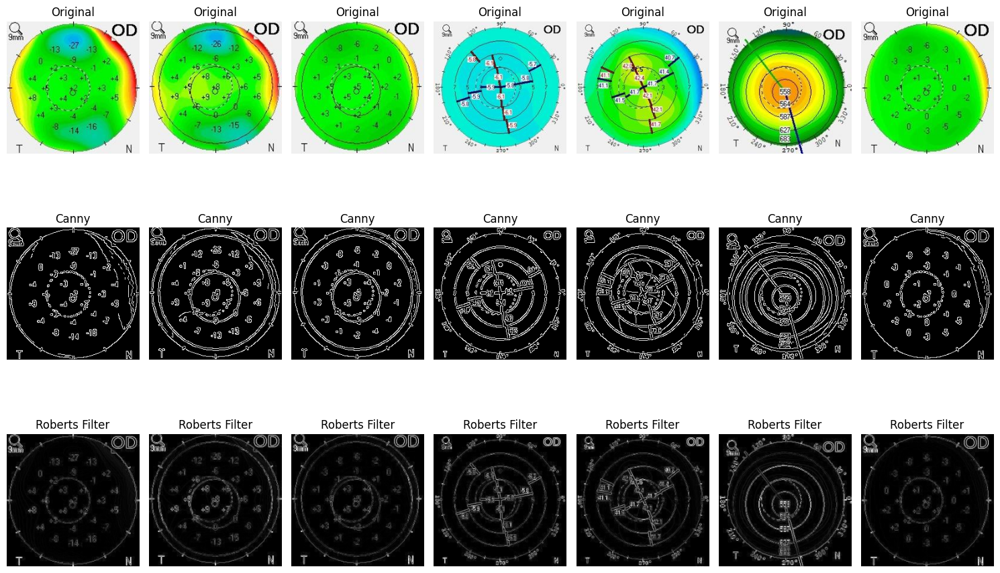

In [8]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import feature, color, filters
 
# Define the path to the case1 folder
case1_path = '/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case1'
 
# List files in the case1 folder
case1_files = os.listdir(case1_path)
 
# Plot all the images
fig, axes = plt.subplots(3, len(case1_files), figsize=(15, 10))
 
for i, file_name in enumerate(case1_files):
    # Read the image
    img = mpimg.imread(os.path.join(case1_path, file_name))
   
    # Plot the original image
    axes[0, i].imshow(img)
    axes[0, i].set_title('Original')
    axes[0, i].axis('off')
   
    # Convert the image to grayscale
    gray_img = color.rgb2gray(img)
   
    # Apply Canny edge detection
    edges = feature.canny(gray_img)
    axes[1, i].imshow(edges, cmap='gray')
    axes[1, i].set_title('Canny')
    axes[1, i].axis('off')
 
    # Apply Roberts filter
    roberts_edges = filters.roberts(gray_img)
    axes[2, i].imshow(roberts_edges, cmap='gray')
    axes[2, i].set_title('Roberts Filter')
    axes[2, i].axis('off')
 
plt.tight_layout()
plt.show()

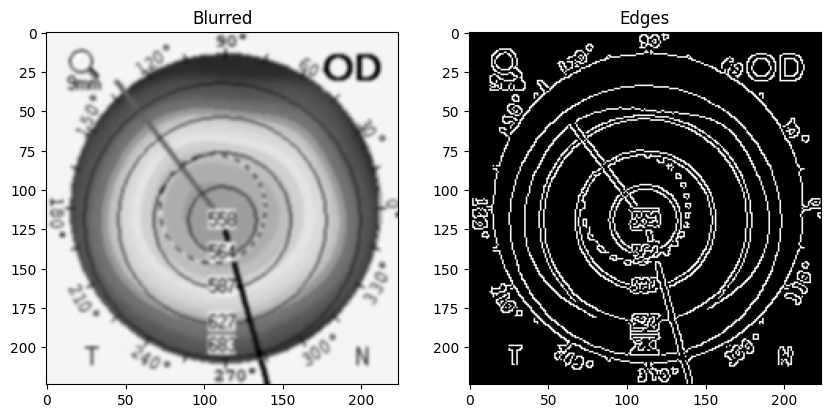

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case1/NOR_1_CT_A.jpg')

# Convert to grayscale for edge detection
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply GaussianBlur
blurred = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Edge detection
edges = cv2.Canny(blurred, threshold1=50, threshold2=150)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(blurred, cmap='gray'), plt.title('Blurred')
plt.subplot(122), plt.imshow(edges, cmap='gray'), plt.title('Edges')
plt.show()


**Changing Colour Space**
 LAB is a color space that separates the luminance (brightness) information from the color information, which can be useful for certain image processing tasks. HSV (Hue, Saturation, Value) is another color space that is often used for color-based image processing tasks

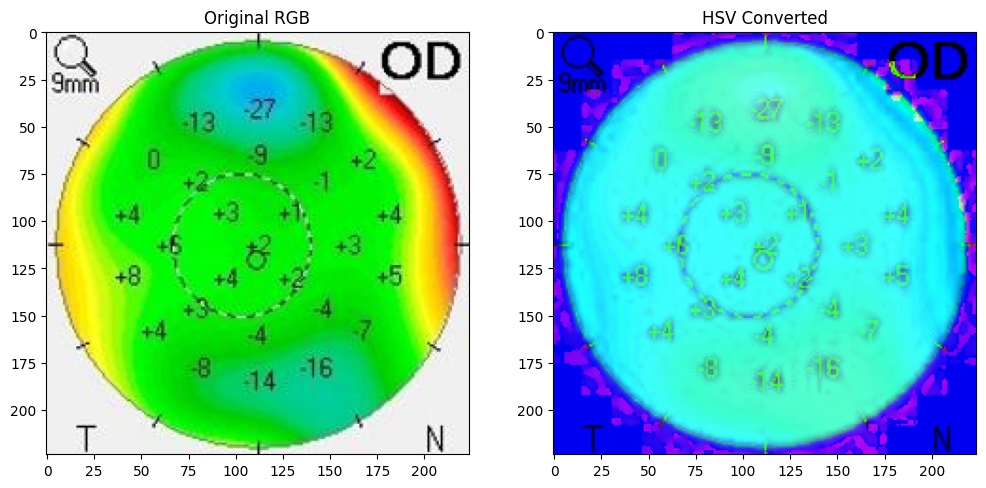

In [10]:

import cv2
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case1/NOR_1_Elv_P.jpg')

# Convert from BGR to RGB (OpenCV loads images in BGR by default)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert from RGB to HSV
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)

# Display the images
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(image_rgb), plt.title('Original RGB')
plt.subplot(122), plt.imshow(image_hsv), plt.title('HSV Converted')
plt.show()


The following code is applying thresholding to an image to segment out a specific region of interest.

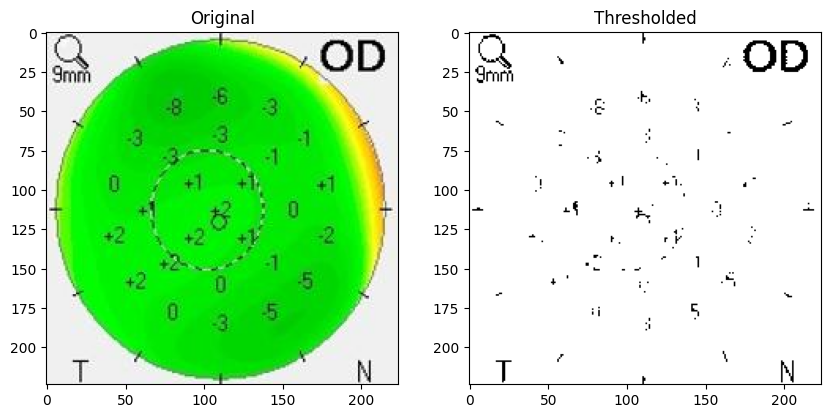

In [11]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case1/NOR_1_Elv_A.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to HSV (or any other suitable color space)
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)

# Use the V channel to apply threshold (or any other channel as per requirement)
v_channel = image_hsv[:,:,2]

# Apply a threshold
_, thresh = cv2.threshold(v_channel, 120, 255, cv2.THRESH_BINARY)

# Display the original and the thresholded image
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_rgb), plt.title('Original')
plt.subplot(122), plt.imshow(thresh, cmap='gray'), plt.title('Thresholded')
plt.show()


# K-Means Clustering
The following code is using K-means clustering to segment an image into different regions based on their color.

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


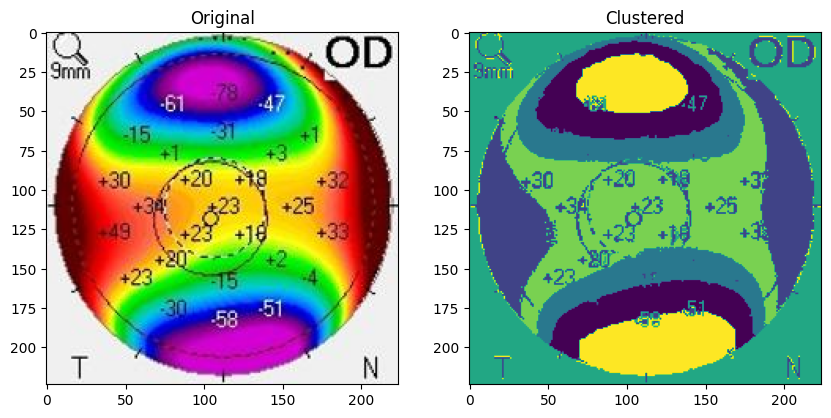

In [12]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case103/NOR_103_EC_P.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to be a list of pixels
pixels = image_rgb.reshape((-1, 3))

# Perform K-means clustering
kmeans = KMeans(n_clusters=6, random_state=42).fit(pixels)
labels = kmeans.labels_

# Reshape the labels back to the image shape
clustered_image = labels.reshape(image_rgb.shape[:2])

# Display the original and the clustered image
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_rgb), plt.title('Original')
plt.subplot(122), plt.imshow(clustered_image), plt.title('Clustered')
plt.show()


# DBSCAN Clustering

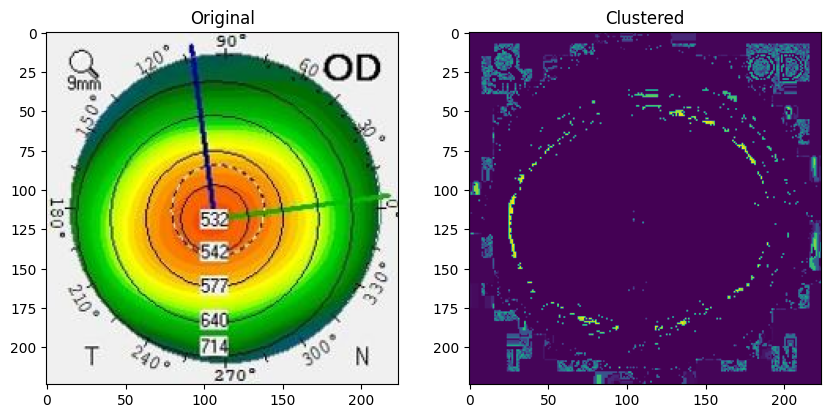

In [13]:
import cv2
import numpy as np
from sklearn.cluster import DBSCAN
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case103/NOR_103_CT_A.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to be a list of pixels
pixels = image_rgb.reshape((-1, 3))

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.2, min_samples=25).fit(pixels)
labels = dbscan.labels_

# Reshape the labels back to the image shape
clustered_image = labels.reshape(image_rgb.shape[:2])

# Display the original and the clustered image
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(image_rgb), plt.title('Original')
plt.subplot(122), plt.imshow(clustered_image), plt.title('Clustered')
plt.show()

detect circles in an image and crop the image to the bounding box of the detected circle.

Find Circles Using Hough Circles: This algorithm is specifically designed to detect circles in an image.

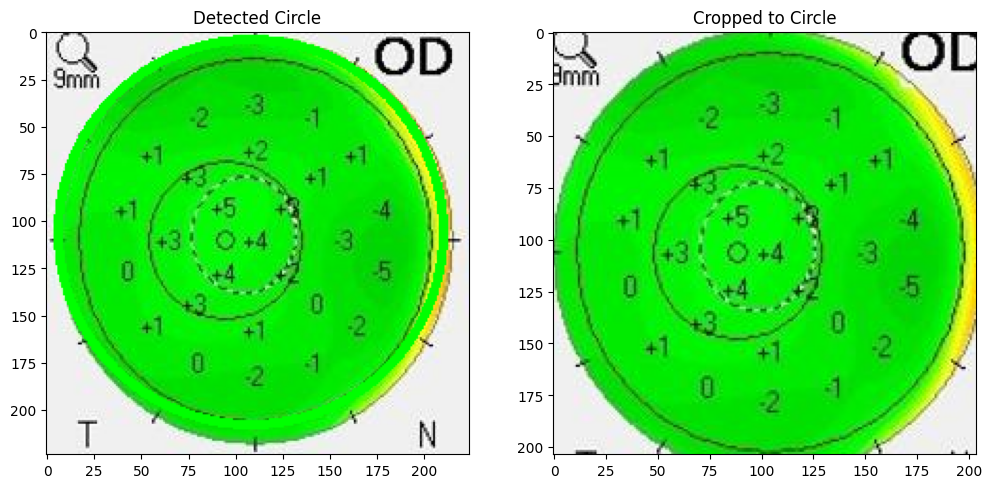

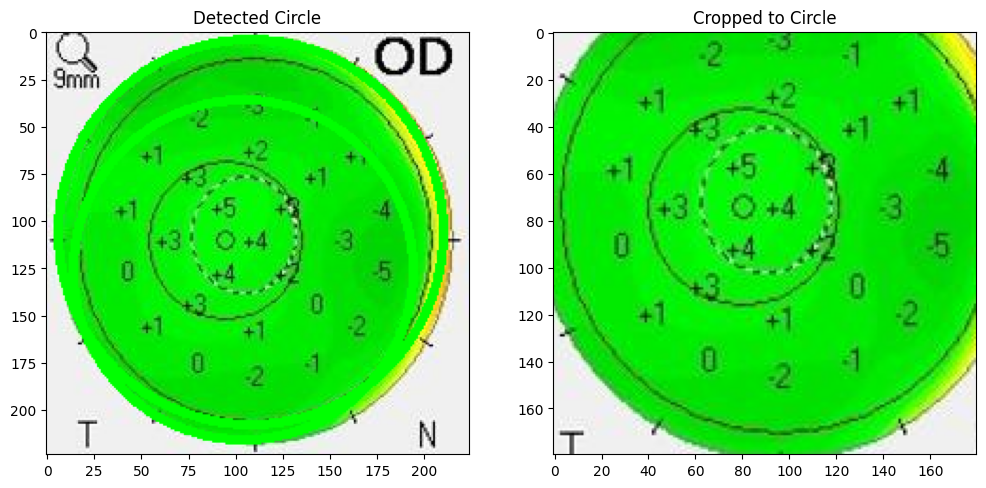

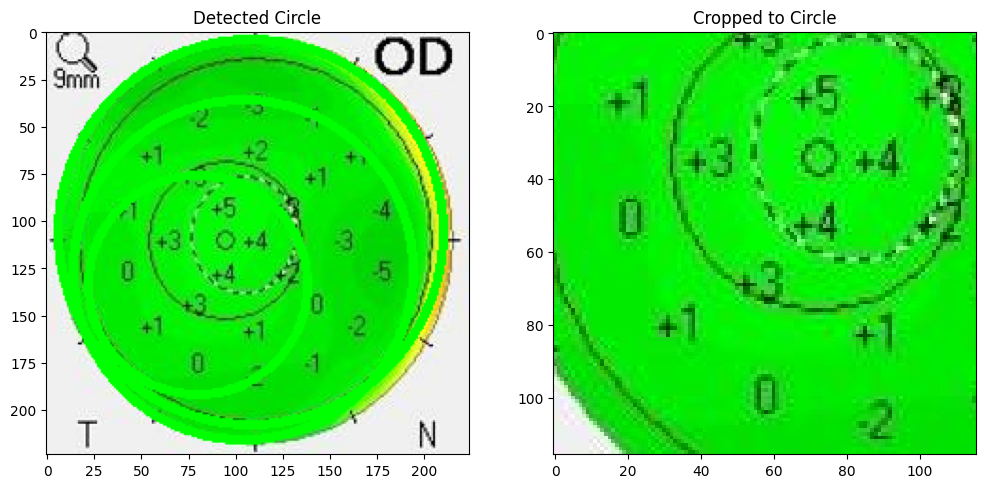

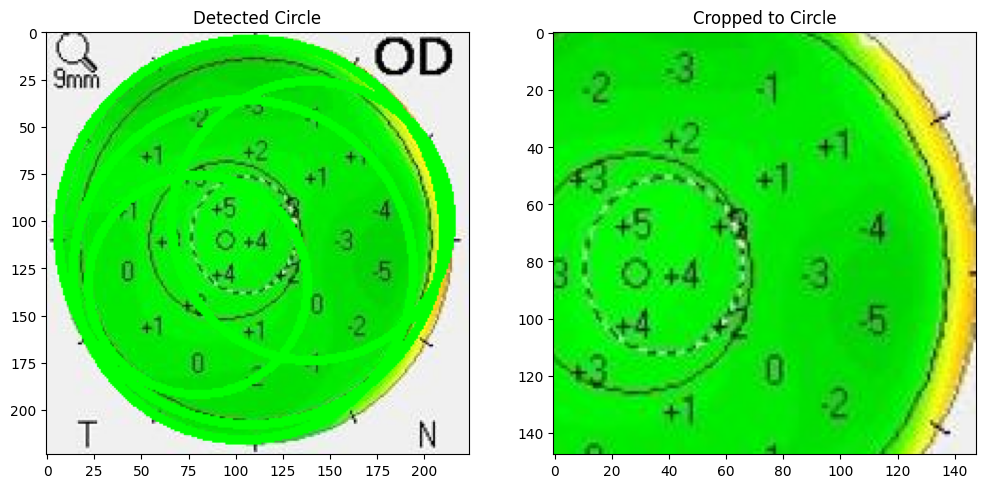

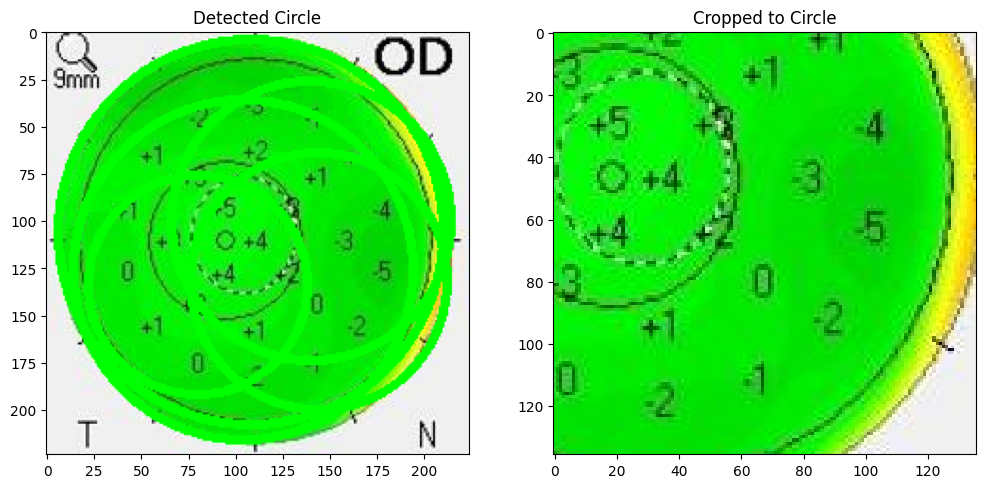

...

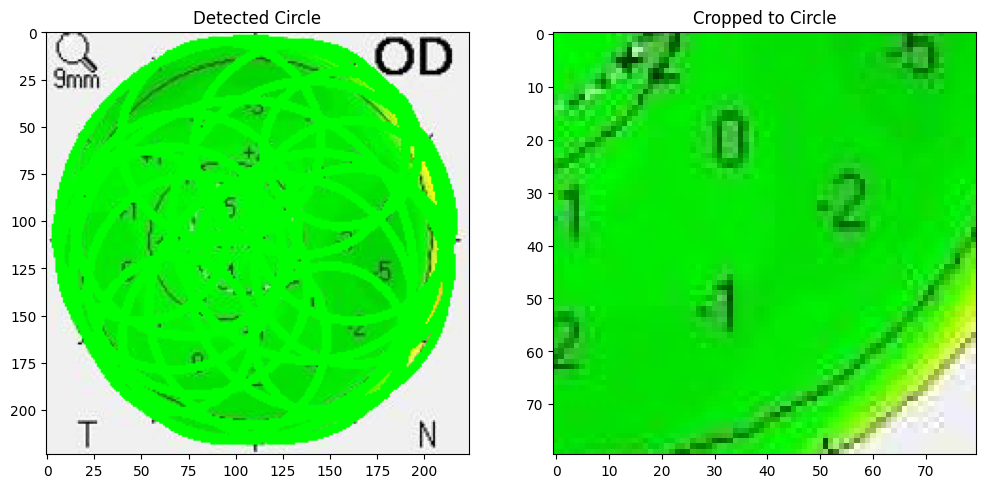

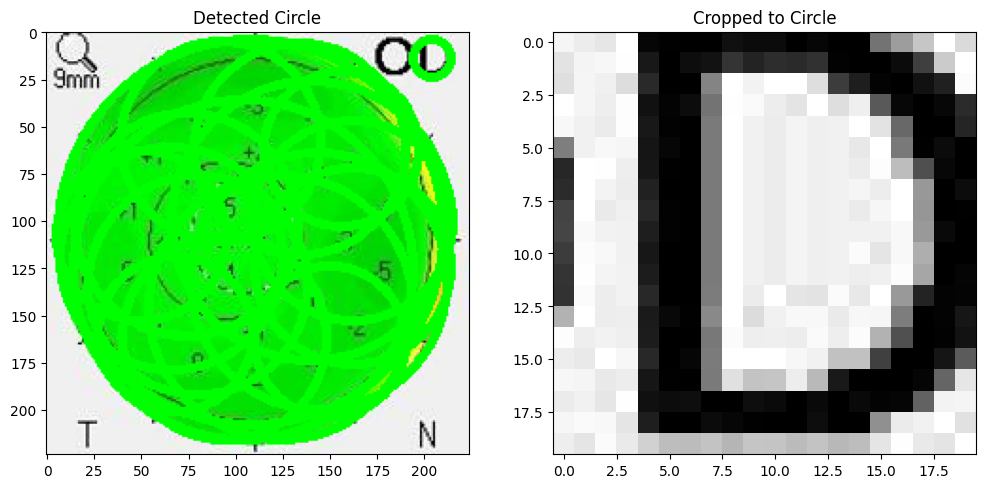

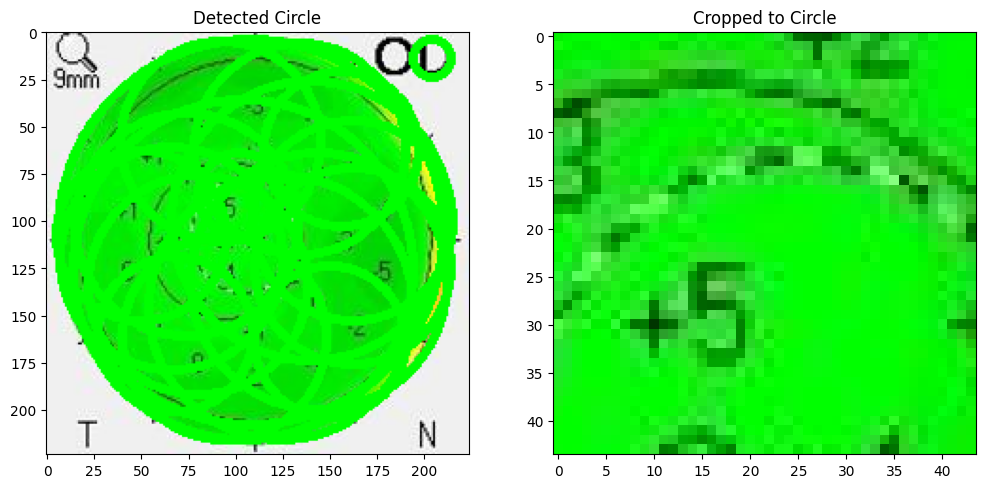

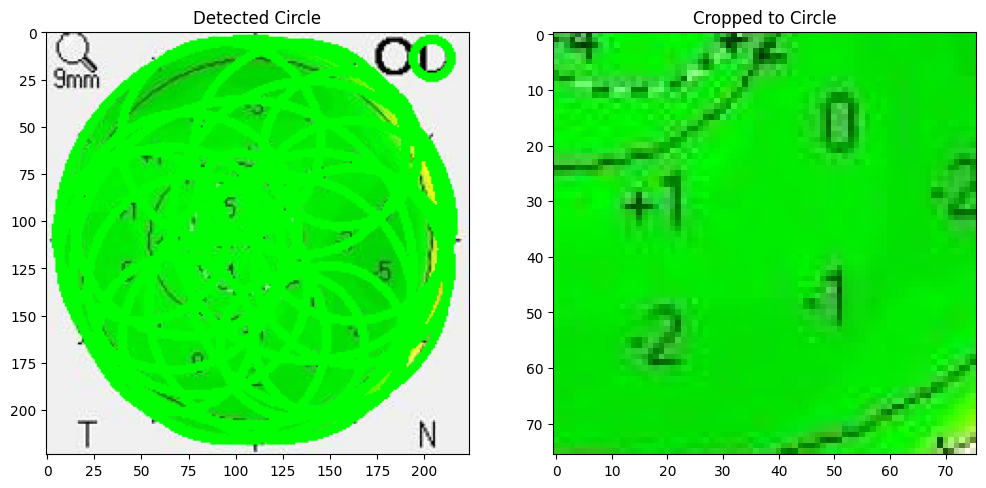

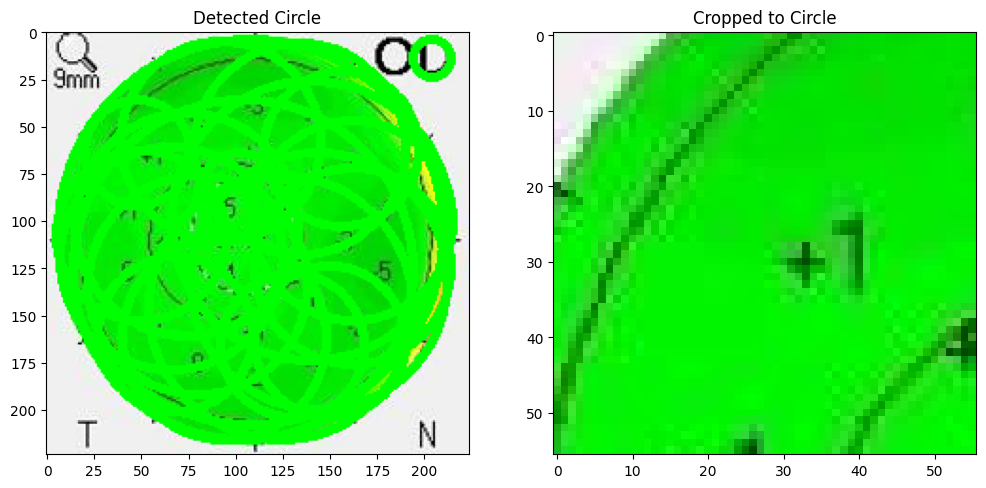

In [14]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case101/NOR_101_EC_A.jpg')
output_image = image.copy()

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply GaussianBlur to reduce noise and improve circle detection
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

# Detect circles using HoughCircles
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, 1, 20, param1=50, param2=30, minRadius=0, maxRadius=0)

# Ensure at least some circles were found
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x, y, r) in circles:
        # Draw the circle in the output
        cv2.circle(output_image, (x, y), r, (0, 255, 0), 4)
        # Crop the image to the bounding box of the circle
        cropped_image = image[y-r:y+r, x-r:x+r]

        # Display the result
        plt.figure(figsize=(12, 6))
        plt.subplot(121), plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)), plt.title('Detected Circle')
        plt.subplot(122), plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)), plt.title('Cropped to Circle')
        plt.show()
else:
    print("No circles were detected")


# **Skeleton**

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


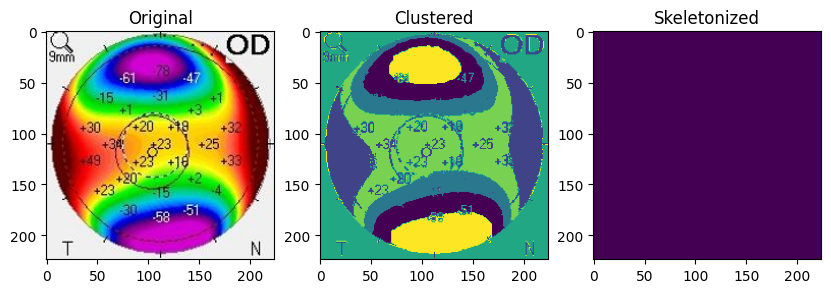

In [15]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
import skimage.morphology
import skimage.measure

# Load the image
image = cv2.imread('/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case103/NOR_103_EC_P.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to be a list of pixels
pixels = image_rgb.reshape((-1, 3))

# Perform K-means clustering
kmeans = KMeans(n_clusters=6, random_state=42).fit(pixels)
labels = kmeans.labels_

# Reshape the labels back to the image shape
clustered_image = labels.reshape(image_rgb.shape[:2])

# Apply thresholding to the clustered image
THRESHOLD1 = 128
thresholded_image = np.array(clustered_image > THRESHOLD1).astype(int)

# Perform skeletonization
skel = skimage.morphology.skeletonize(thresholded_image)
skel = np.uint8(skel) * 255

# Display the original, clustered, and skeletonized images
plt.figure(figsize=(10, 5))
plt.subplot(131), plt.imshow(image_rgb), plt.title('Original')
plt.subplot(132), plt.imshow(clustered_image), plt.title('Clustered')
plt.subplot(133), plt.imshow(skel), plt.title('Skeletonized')
plt.show()

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


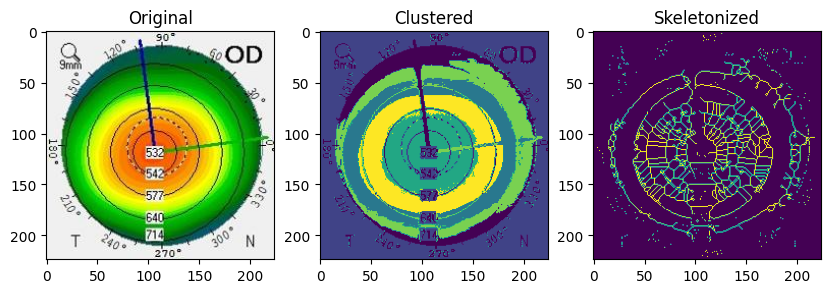

In [16]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
import skimage.morphology
import skimage.measure

# Try to load the image
image_path = '/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case103/NOR_103_CT_A.jpg'
try:
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"No image found at {image_path}")
except FileNotFoundError as e:
    print(e)
    exit()

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert RGB image to Lab color space to improve clustering
image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2Lab)

# Reshape the image to be a list of pixels
pixels = image_lab.reshape((-1, 3))

# Perform K-means clustering
kmeans = KMeans(n_clusters=6, random_state=42).fit(pixels)
labels = kmeans.labels_

# Reshape the labels back to the image shape
clustered_image = labels.reshape(image_rgb.shape[:2])

# Use Otsu's method to find the optimal threshold value
_, thresholded_image = cv2.threshold(clustered_image.astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Perform skeletonization if there are any white pixels
if thresholded_image.max() > 0:
    skel = skimage.morphology.skeletonize(thresholded_image > 0)
    skel = np.uint8(skel) * 255
else:
    skel = np.zeros_like(thresholded_image)

# Display the original, clustered, and skeletonized images
plt.figure(figsize=(10, 5))
plt.subplot(131), plt.imshow(image_rgb), plt.title('Original')
plt.subplot(132), plt.imshow(clustered_image), plt.title('Clustered')
plt.subplot(133), plt.imshow(skel), plt.title('Skeletonized')
plt.show()


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

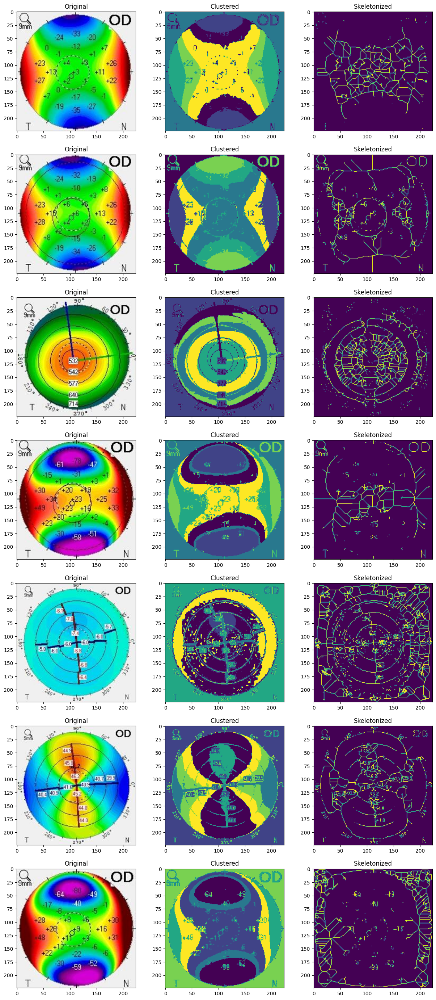

In [18]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
import skimage.morphology
import skimage.measure
import os

# Specify the folder path
folder_path = '/kaggle/input/keratoconus-detection/Train_Validation sets/Train_Validation sets/Normal/case103/'

# Get a list of image files in the folder
image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]

# Create a figure with subplots
fig, axs = plt.subplots(nrows=len(image_files), ncols=3, figsize=(15, 5*len(image_files)))

# Loop through each image file
for i, image_path in enumerate(image_files):
    try:
        image = cv2.imread(image_path)
        if image is None:
            raise FileNotFoundError(f"No image found at {image_path}")
    except FileNotFoundError as e:
        print(e)
        continue

    # Convert the image from BGR to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Convert RGB image to Lab color space to improve clustering
    image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2Lab)

    # Reshape the image to be a list of pixels
    pixels = image_lab.reshape((-1, 3))

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=6, random_state=42).fit(pixels)
    labels = kmeans.labels_

    # Reshape the labels back to the image shape
    clustered_image = labels.reshape(image_rgb.shape[:2])

    # Use Otsu's method to find the optimal threshold value
    _, thresholded_image = cv2.threshold(clustered_image.astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Perform skeletonization if there are any white pixels
    if thresholded_image.max() > 0:
        skel = skimage.morphology.skeletonize(thresholded_image > 0)
        skel = np.uint8(skel) * 255
    else:
        skel = np.zeros_like(thresholded_image)

    # Display the original, clustered, and skeletonized images
    axs[i, 0].imshow(image_rgb), axs[i, 0].set_title('Original')
    axs[i, 1].imshow(clustered_image), axs[i, 1].set_title('Clustered')
    axs[i, 2].imshow(skel), axs[i, 2].set_title('Skeletonized')

plt.show()